In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
data = pd.read_csv("Heart")
data

,Unnamed: 0,age,sex,chest pain type,resting bps,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,0,40,1,2,140,289.0,0,0,172,0,0.0,1,0
1,1,49,0,3,160,180.0,0,0,156,0,1.0,2,1
2,2,37,1,2,130,283.0,0,1,98,0,0.0,1,0
3,3,48,0,4,138,214.0,0,0,108,1,1.5,2,1
4,4,54,1,3,150,195.0,0,0,122,0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,297,68,0,3,120,211.0,0,0,115,0,1.5,1,1
1044,298,44,0,3,108,141.0,0,1,175,0,0.6,1,1
1045,299,52,1,1,128,255.0,0,1,161,1,0.0,2,0
1046,300,59,1,4,160,273.0,0,0,125,0,0.0,2,0


In [5]:
df = pd.DataFrame(data)

In [61]:
X = df.iloc[:,3:4].head(50)
y = df.iloc[:,-1].head(50)

In [63]:
from sklearn.linear_model import Perceptron

In [65]:
p = Perceptron()

In [67]:
p.fit(X,y)

,penalty,None
,alpha,0.0001
,l1_ratio,0.15
,fit_intercept,True
,max_iter,1000
,tol,0.001
,shuffle,True
,verbose,0
,eta0,1.0
,n_jobs,None
,random_state,0


In [69]:
p.coef_

array([[5.]])

In [71]:
p.intercept_

array([-12.])

In [55]:
!pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable


In [73]:
from mlxtend.plotting import plot_decision_regions

C:\Users\hp\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but Perceptron was fitted with feature names
  The input samples.


<Axes: >

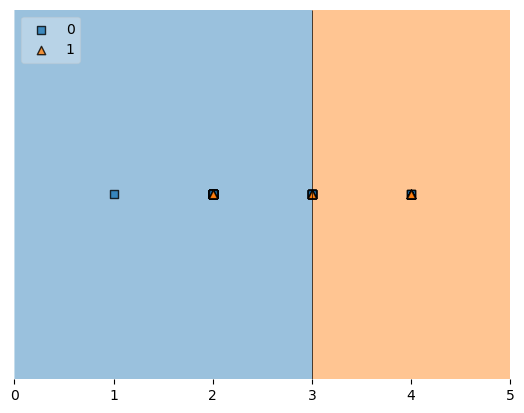

In [75]:
plot_decision_regions(X.values, y.values, clf = p, legend = 2)

In [81]:
!pip install --upgrade numpy scikit-learn

Defaulting to user installation because normal site-packages is not writeable


In [4]:
import numpy as np

In [6]:
from sklearn.datasets import make_classification

In [16]:
X,y = make_classification(n_samples = 100 , n_features = 2, n_informative = 1, n_redundant = 0, 
                          n_classes = 2, n_clusters_per_class = 1, random_state=41 , hypercube = False , class_sep = 10)

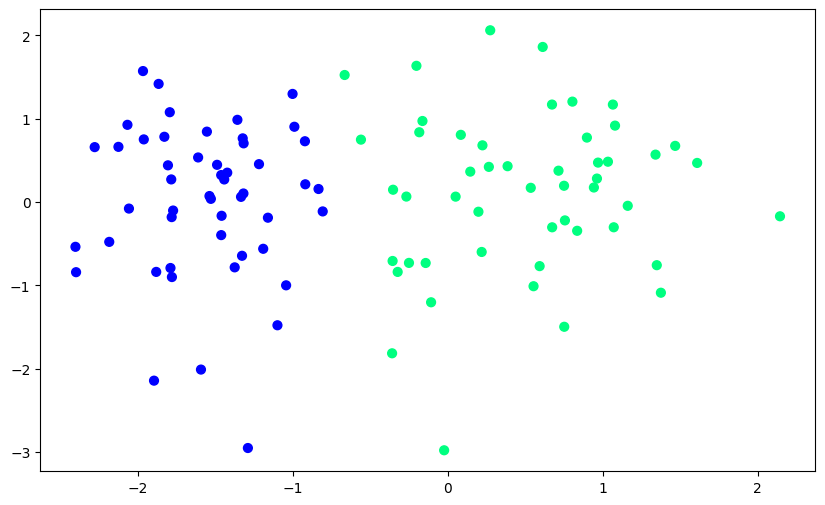

In [18]:
plt.figure(figsize =(10,6))
plt.scatter(X[:,0],X[:,1], c=y, cmap = 'winter', s = 40)
plt.show()

In [20]:
def perceptron(X,y):
    X = np.insert(X,0,1,axis = 1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j] - y_hat)*X[j]
    return weights[0] , weights[1:]      

In [22]:
def step(z):
    return 1 if z > 0 else 0

In [24]:
intercept_, coef_ = perceptron(X,y)

In [26]:
print(coef_)
print(intercept_)

[1.28885551 0.11422373]
0.9


In [28]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [30]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

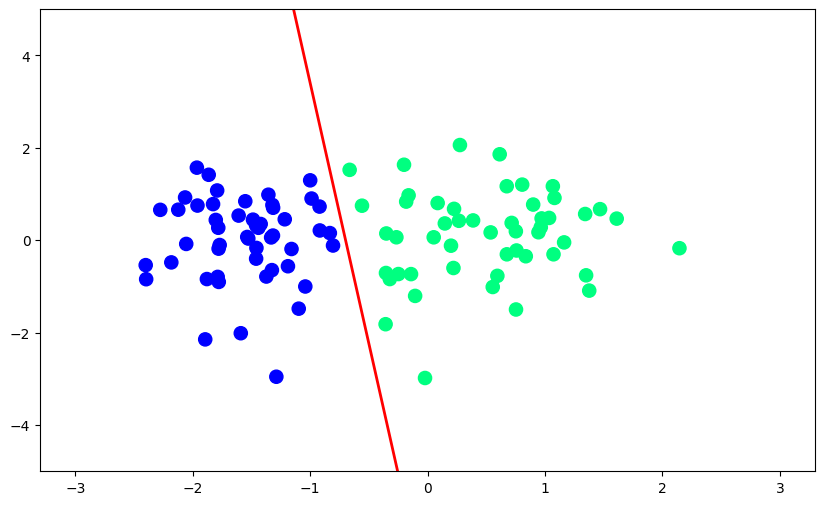

In [32]:
plt.figure(figsize = (10,6))
plt.plot(x_input, y_input , color = 'red', linewidth = 2)
plt.scatter(X[:,0],X[:,1], c=y , cmap = 'winter', s = 90)
plt.ylim(-5,5)
plt.show()

# Now create Animation of  perceptron

In [34]:
  def perceptron(X,y):
      m = []
      b = []
      X = np.insert(X,0,1,axis = 1)
      weights = np.ones(X.shape[1])
      lr = 0.1
      for i in range(200):
          j = np.random.randint(0,100)
          y_hat = step(np.dot(X[j], weights))
          weights = weights + lr * (y[j] - y_hat) * X[j]
          
          m.append(-(weights[1]/weights[2]))
          b.append(-(weights[0]/weights[2]))
      return m,b    

In [36]:
m,b = perceptron(X,y)

In [38]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

In [40]:
from IPython.display import display
from IPython.display import HTML
%matplotlib inline

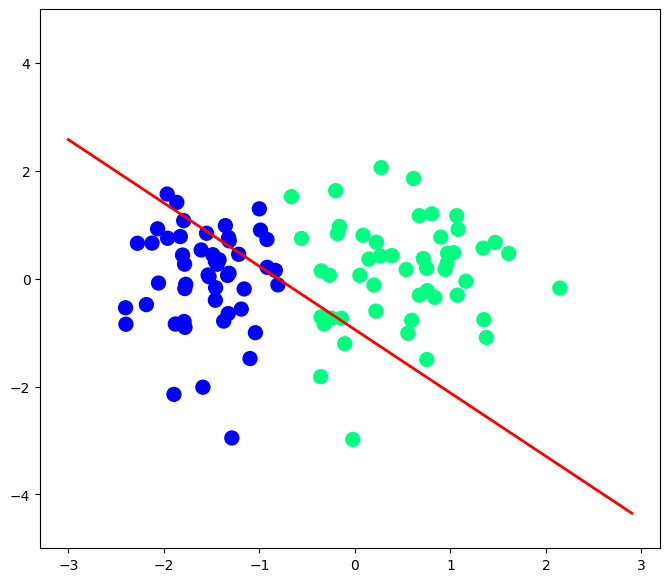

In [42]:

fig ,ax = plt.subplots(figsize = (8,7))

x_i = np.arange(-3,3,0.1)
y_i = x_i*m[0] + b[0]
ax.scatter(X[:,0],X[:,1],c=y, cmap = 'winter', s = 100)
line, = ax.plot(x_i , x_i*m[0] + b[0], 'r-', linewidth = 2)
plt.ylim(-5,5)
def update(i):
    label = 'epoch{0}'.format(i + 1)
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(label)
    # return line, ax
anim = FuncAnimation(fig, update, repeat = True, frames = 200, interval = 100)
plt.show()
HTML(anim.to_jshtml())